# Feature Based Exposure Grouping
We explore a feature-based exposure grouping algorithm:
- Compute keypoints in temporally adjacent exposures.
- Compute matches between them.
- Compute a homography and check that the induced norm of $H$ is below some $\epsilon$

## Alignment Coefficient
First, we load some test images:

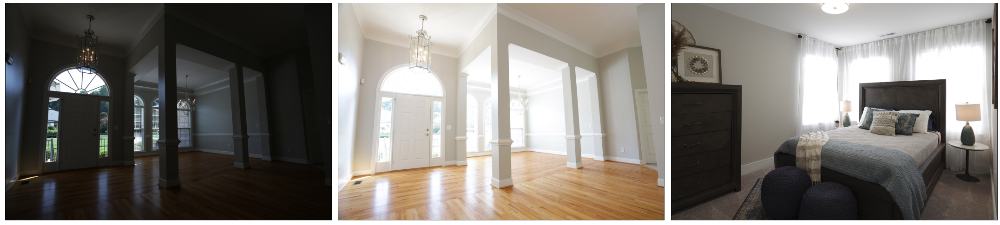

In [6]:
from imageio import imread
from matplotlib import pyplot as plt

# Load images
image_a = imread("../test/media/group/15.jpg")
image_b = imread("../test/media/group/16.jpg")
image_c = imread("../test/media/group/17.jpg")

# Plot
plt.figure(figsize=(30, 20))
plt.subplot(1, 3, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(image_a)
plt.subplot(1, 3, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(image_b)
plt.subplot(1, 3, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(image_c)
plt.tight_layout()
plt.show()

Now, we detect features:

In [1]:
from cv2 import DescriptorMatcher_create, drawMatches, ORB_create, DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING

# Detect features
orb = ORB_create(1000)
keypoints_a, descriptors_a = orb.detectAndCompute(image_a, None)
keypoints_b, descriptors_b = orb.detectAndCompute(image_b, None)
keypoints_c, descriptors_c = orb.detectAndCompute(image_c, None)

# Match features
matcher = DescriptorMatcher_create(DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
matches_ab = matcher.match(descriptors_a, descriptors_b, None)
matches_bc = matcher.match(descriptors_b, descriptors_c, None)

# Extract top k
matches_ab = sorted(matches_ab, key=lambda x: x.distance)
matches_bc = sorted(matches_bc, key=lambda x: x.distance)
matches_ab = matches_ab[:int(len(matches_ab) * 0.15)]
matches_bc = matches_bc[:int(len(matches_bc) * 0.15)]

# Draw matches
image_matches_ab = drawMatches(image_a, keypoints_a, image_b, keypoints_b, matches_ab, None)
image_matches_bc = drawMatches(image_b, keypoints_b, image_c, keypoints_c, matches_bc, None)
plt.figure(figsize=(30, 20))
plt.subplot(2, 1, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(image_matches_ab, interpolation="bilinear")
plt.subplot(2, 1, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(image_matches_bc, interpolation="bilinear")
plt.tight_layout()
plt.show()

NameError: name 'image_a' is not defined

Now, we compute homographies between the pairs:

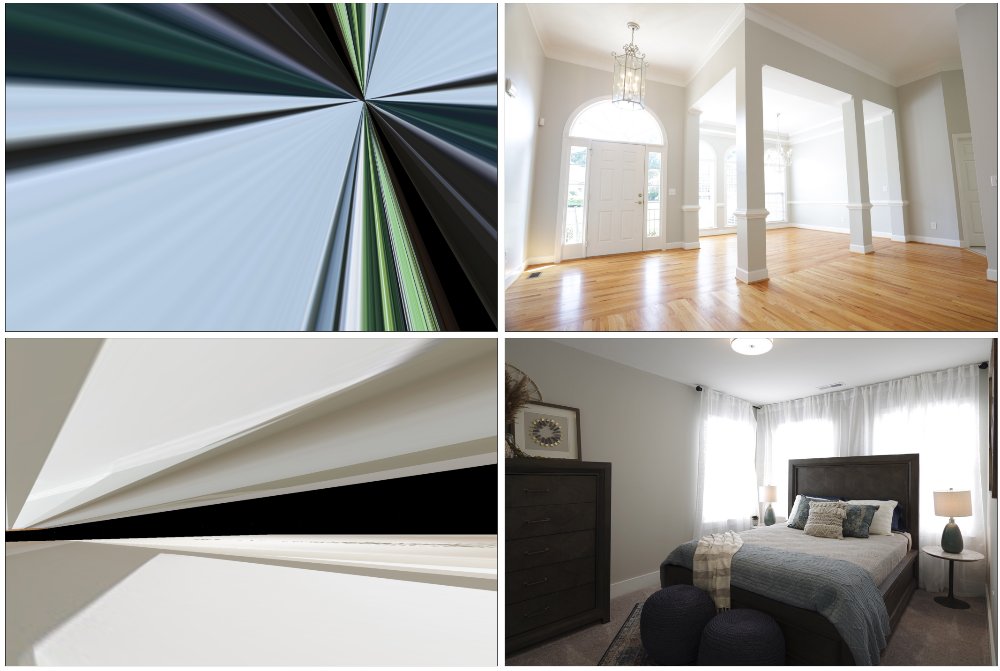

In [8]:
from cv2 import findHomography, warpPerspective, RANSAC
from numpy import array

# Compute homography
H_ab, _ = findHomography(
    array([keypoints_a[match.queryIdx].pt for match in matches_ab]),
    array([keypoints_b[match.trainIdx].pt for match in matches_ab]),
    RANSAC
)
H_bc, _ = findHomography(
    array([keypoints_b[match.queryIdx].pt for match in matches_bc]),
    array([keypoints_c[match.trainIdx].pt for match in matches_bc]),
    RANSAC
)

# Warp
warped_a = warpPerspective(image_a, H_ab, image_b.shape[:2][::-1])
warped_b = warpPerspective(image_b, H_bc, image_c.shape[:2][::-1])

# Plot
plt.figure(figsize=(30, 20))
plt.subplot(2, 2, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(warped_a, interpolation="bilinear")
plt.subplot(2, 2, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(image_b, interpolation="bilinear")
plt.subplot(2, 2, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(warped_b, interpolation="bilinear")
plt.subplot(2, 2, 4)
plt.xticks([])
plt.yticks([])
plt.imshow(image_c, interpolation="bilinear")
plt.tight_layout()
plt.show()

Clearly, ORB is not robust to exposure differences. We can quantify the failures above using the *alignment coefficient*, defined as:

\begin{align}
    \phi(H_{ab}) = \vert \Vert H_{ab} \Vert_2 - \Vert I \Vert_2 \vert
\end{align}

Where $H_{ab} \in \mathbb{R}^{3 \times 3}$ is the approximate homography mapping an image $a$ to image $b$ and $\phi(\cdot): \mathbb{R}^{3 \times 3} \mapsto \mathbb{R}^{+}$. We expect that for a correct image pair, $\phi(H) \approx 0$. We compute the induced matrix norm as:

\begin{align}
    \Vert H \Vert_2 = \sqrt{\lambda_{\text{max}}(H^T H)}
\end{align}

In [4]:
from numpy import sqrt
from numpy.linalg import eig

def alignment_coefficient (H):
    s_vals, _ = eig(H.T * H)
    i_norm = sqrt(s_vals.max())
    return abs(i_norm - 1.)

We check the coefficients for the above image pairs:

In [9]:
print(alignment_coefficient(H_ab))
print(alignment_coefficient(H_bc))

6.155934019938458
1.469603298753666


## Normalized Exposure Alignment Coefficient
We use the histogram matching trick from edge-based exposure grouping:

In [11]:
from numpy import float64, interp, uint8, unique

def histogram_match (input, target):
    # Source: https://stackoverflow.com/questions/32655686/histogram-matching-of-two-images-in-python-2-x
    s_values, bin_idx, s_counts = unique(input.ravel(), return_inverse=True, return_counts=True)
    t_values, t_counts = unique(target.ravel(), return_counts=True)
    s_quantiles = s_counts.cumsum().astype(float64)
    s_quantiles /= s_quantiles[-1]
    t_quantiles = t_counts.cumsum().astype(float64)
    t_quantiles /= t_quantiles[-1]
    interp_t_values = interp(s_quantiles, t_quantiles, t_values)
    result = interp_t_values[bin_idx].reshape(input.shape)
    return result

def equalized_exposure (image_a, image_b):
    std_a, std_b = image_a.std(), image_b.std()
    input, target = (image_a, image_b) if std_a < std_b else (image_b, image_a)
    matched = histogram_match(input, target).astype(uint8)
    return matched, target

Now, we normalize the pairs.

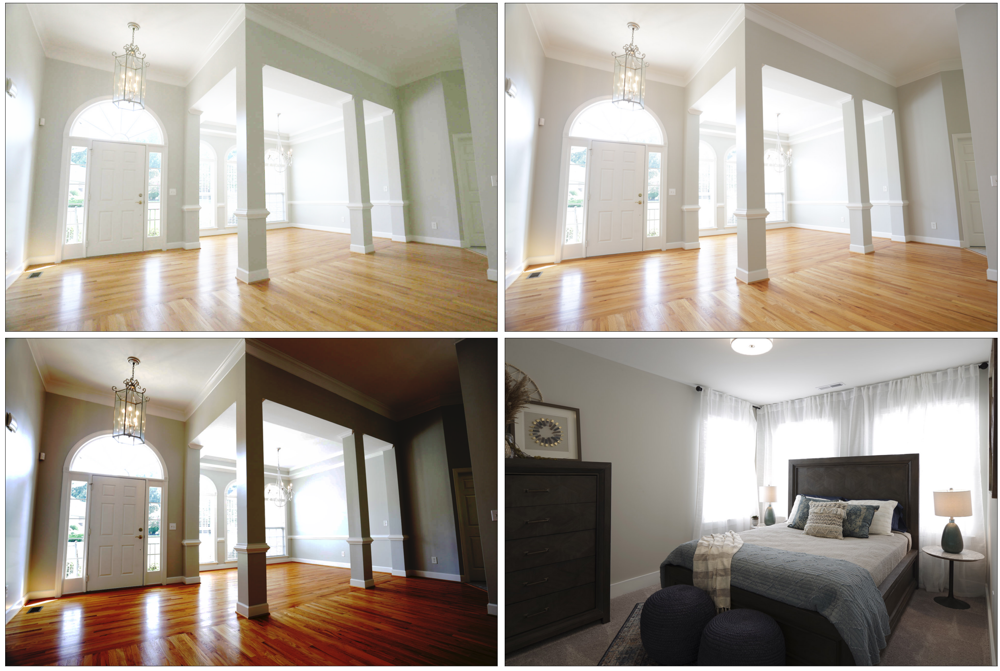

In [13]:
# Normalize
image_d, image_e = equalized_exposure(image_a, image_b)
image_f, image_g = equalized_exposure(image_b, image_c)

# Plot
plt.figure(figsize=(30, 20))
plt.subplot(2, 2, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(image_d, interpolation="bilinear")
plt.subplot(2, 2, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(image_e, interpolation="bilinear")
plt.subplot(2, 2, 3)
plt.xticks([])
plt.yticks([])
plt.imshow(image_f, interpolation="bilinear")
plt.subplot(2, 2, 4)
plt.xticks([])
plt.yticks([])
plt.imshow(image_g, interpolation="bilinear")
plt.tight_layout()
plt.show()

Redetecting features:

In [27]:
# Detect features
orb = ORB_create(1000)
keypoints_d, descriptors_d = orb.detectAndCompute(image_d, None)
keypoints_e, descriptors_e = orb.detectAndCompute(image_e, None)
keypoints_f, descriptors_f = orb.detectAndCompute(image_f, None)
keypoints_g, descriptors_g = orb.detectAndCompute(image_g, None)

# Match features
matcher = DescriptorMatcher_create(DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
matches_de = matcher.match(descriptors_d, descriptors_e, None)
matches_fg = matcher.match(descriptors_f, descriptors_g, None)

# Extract top k
matches_de = sorted(matches_de, key=lambda x: x.distance)
matches_fg = sorted(matches_fg, key=lambda x: x.distance)
matches_de = matches_de[:int(len(matches_de) * 0.15)]
matches_fg = matches_fg[:int(len(matches_fg) * 0.15)]

# Draw matches
# image_matches_de = drawMatches(image_d, keypoints_d, image_e, keypoints_e, matches_de, None)
# image_matches_fg = drawMatches(image_f, keypoints_f, image_g, keypoints_g, matches_fg, None)
# plt.figure(figsize=(30, 20))
# plt.subplot(2, 1, 1)
# plt.xticks([])
# plt.yticks([])
# plt.imshow(image_matches_de, interpolation="bilinear")
# plt.subplot(2, 1, 2)
# plt.xticks([])
# plt.yticks([])
# plt.imshow(image_matches_fg, interpolation="bilinear")
# plt.tight_layout()
# plt.show()

Now, we check the alignment coefficients:

In [17]:
# Compute homography
H_de, _ = findHomography(
    array([keypoints_d[match.queryIdx].pt for match in matches_de]),
    array([keypoints_e[match.trainIdx].pt for match in matches_de]),
    RANSAC
)
H_fg, _ = findHomography(
    array([keypoints_f[match.queryIdx].pt for match in matches_fg]),
    array([keypoints_g[match.trainIdx].pt for match in matches_fg]),
    RANSAC
)

# Log coeffs
print(alignment_coefficient(H_de))
print(alignment_coefficient(H_fg))

2.0228263508670352e-13
0.912107860690683
